In [1]:
import matplotlib.pyplot as plt
import shap
import pickle
import cloudpickle
import numpy as np
from comparers import ModelComparer
from explainers import generate_shap_explanations
from plots import plot_decision_boundary, plot_2d, plot_feature_importance_bar, plot_feature_importance_scatter,\
                  plot_feature_effects, plot_forces
from util import calc_feature_order, calc_class_order, calc_instance_order
shap.initjs()
%matplotlib inline
task_name = '01'

In [11]:
try:
    with open(task_name + '.models', 'rb') as f:
        comparer = pickle.load(f)
    with open(task_name + '.expl', 'rb') as f:
        explanations = pickle.load(f)
    print('loaded saved state')
except FileNotFoundError:
    pass

loaded saved state


# Setup Task

In [2]:
from sklearn.utils import resample
X, y = shap.datasets.adult()
feature_names = np.array(X.columns)
X = X.values
display_data = shap.datasets.adult(display=True)[0].values
n_features = len(feature_names)
n_samples = X.shape[0]

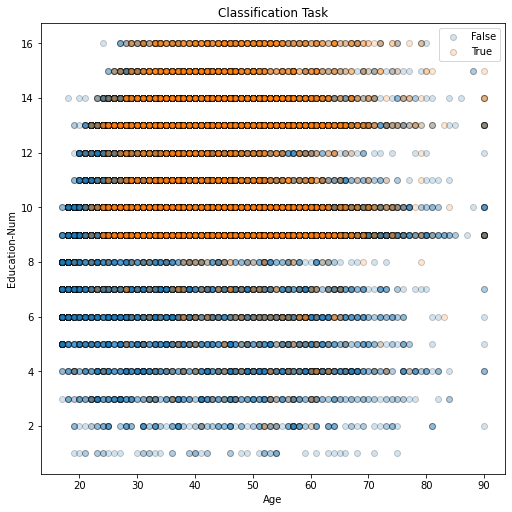

In [4]:
fig, ax = plt.subplots(figsize=(7, 7), constrained_layout=True)
plot_decision_boundary(X, y, 'Classification Task', feature_names,
                       X_display=display_data, idx_x=0, idx_y=2, fig=fig, ax=ax, alpha=0.2)

In [5]:
%%time
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.utils.multiclass import unique_labels
from sklearn.linear_model import LogisticRegression

class ModifiedClassifier(BaseEstimator, ClassifierMixin):
    
    def  __init__(self, base_model):
        self.base_model = base_model
        
    def fit(self, X, y):
        return self
    
    @property
    def classes_(self):
        return self.base_model.classes_
    
    def predict(self, X):
        return self.base_model.predict(self._preprocess(X))
    
    def predict_proba(self, X):
        return self.base_model.predict_proba(self._preprocess(X))
    
    def predict_log_proba(self, X):
        return self.base_model.predict_log_proba(self._preprocess(X))
    
    def _preprocess(self, X):
        X2 = X.copy()
        X2[(40 <= X[:, 0]) & (X[:, 0] < 50), 2] += 1
        return X2
    
clf_a = LogisticRegression(C=1.0, max_iter=10000)
clf_a.fit(X, y)
clf_b = ModifiedClassifier(clf_a)
clf_b.fit(X, y)
comparer = ModelComparer(clf_a, clf_b, feature_names)
comparer.fit(X, y)
with open(task_name + '.models', 'wb') as f:
    cloudpickle.dump(comparer, f, pickle.HIGHEST_PROTOCOL)

CPU times: user 14.8 s, sys: 1.12 s, total: 15.9 s
Wall time: 8.13 s


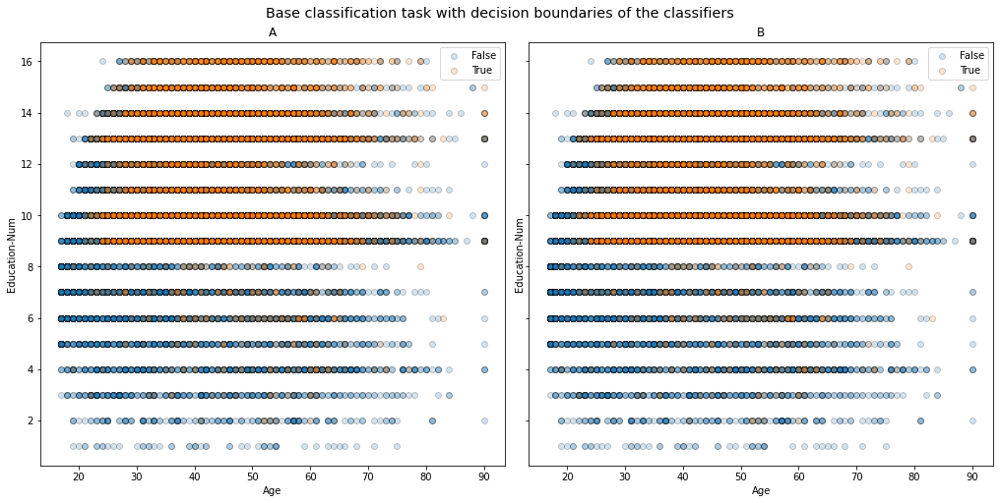

In [6]:
comparer.plot_individual_clf_decision_boundaries(X, display_data, y, kind='label', idx_x=0, idx_y=2, alpha=0.2)

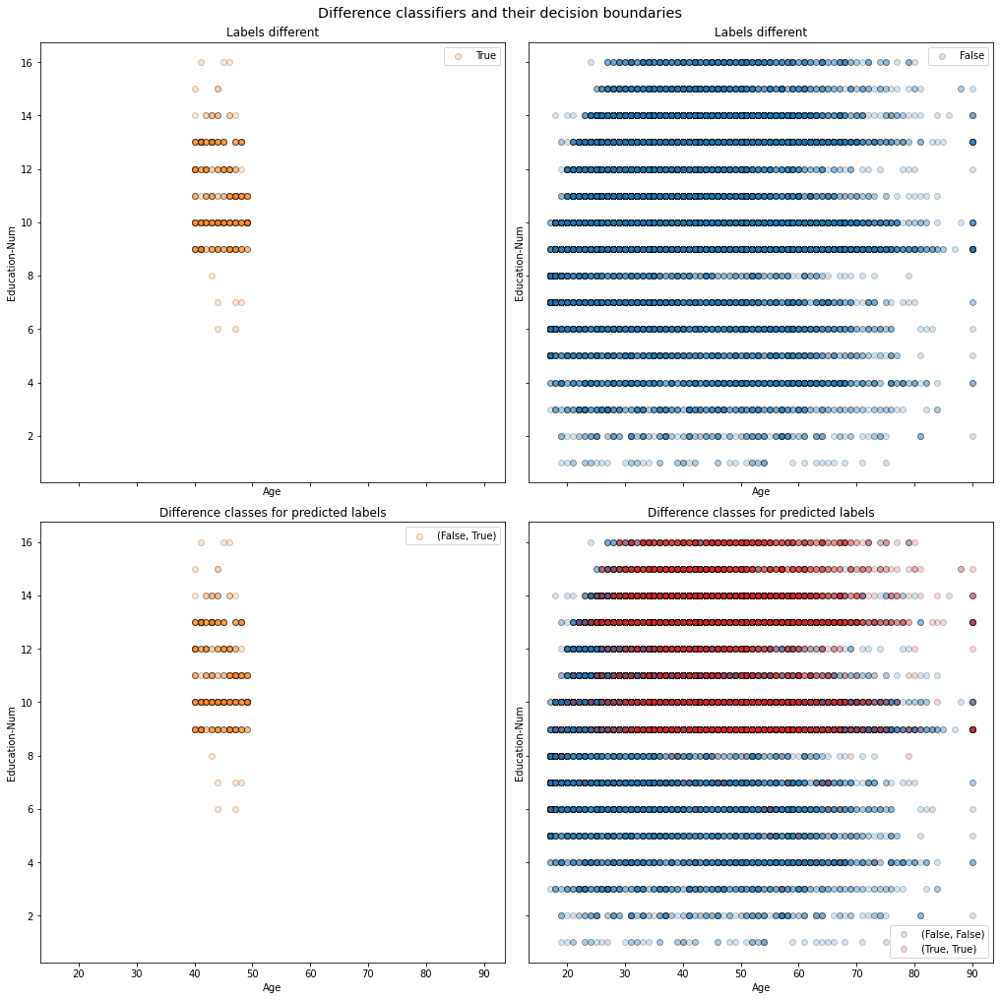

In [7]:
comparer.plot_decision_boundaries(X, display_data, kind='label', idx_x=0, idx_y=2, separate=True, alpha=0.2)

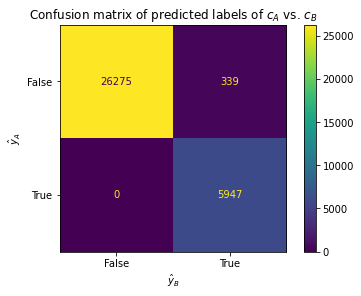

In [8]:
comparer.plot_confusion_matrix(X)

# Explain using Interpretability Methods

In [9]:
is_pred_diff = comparer.predict_bin_diff(X)
is_pred_diff_indices = np.where(is_pred_diff)[0]
is_pred_equal_indices = np.where(~is_pred_diff)[0]
is_pred_equal_indices = resample(is_pred_equal_indices, replace=False, n_samples=1000-len(is_pred_diff_indices), random_state=0)
sample_indices = np.concatenate([is_pred_diff_indices, is_pred_equal_indices])
X_explain = X[sample_indices]
display_data_explain = display_data[sample_indices]
y_explain = y[sample_indices]

In [10]:
%%time
explanations = generate_shap_explanations(comparer, X_explain, display_data_explain)
with open(task_name + '.expl', 'wb') as f:
    pickle.dump(explanations, f, pickle.HIGHEST_PROTOCOL)

Permutation explainer: 1001it [00:12, 18.51it/s]                          
Permutation explainer: 1001it [00:11, 11.13it/s]                         
divide by zero encountered in log
Permutation explainer: 1001it [00:14, 17.75it/s]                         
Permutation explainer: 1001it [00:10,  2.52it/s]                         
Permutation explainer: 1001it [00:18, 22.97it/s]                         


CPU times: user 3min 42s, sys: 20.6 s, total: 4min 3s
Wall time: 2min 12s


## Visualize SHAP values

### Individual explanations

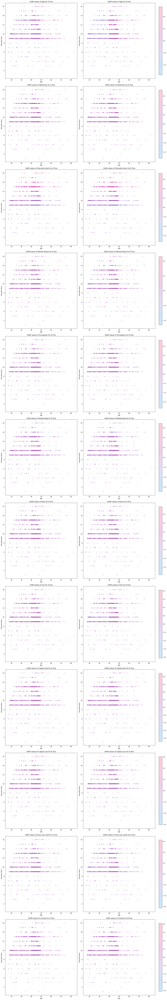

In [11]:
plot_2d(explanations.indiv.labels[:, :, 1].merged, x='Age', y='Education-Num', alpha=0.2)

### Simple subtraction explanation

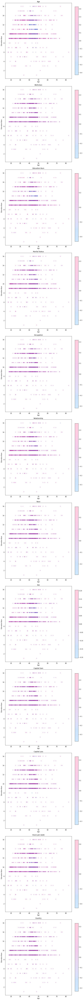

In [12]:
plot_2d(explanations.indiv_diff.labels[:, :, 'True'], x='Age', y='Education-Num', alpha=0.2)

### Multiclass difference classifier explanations

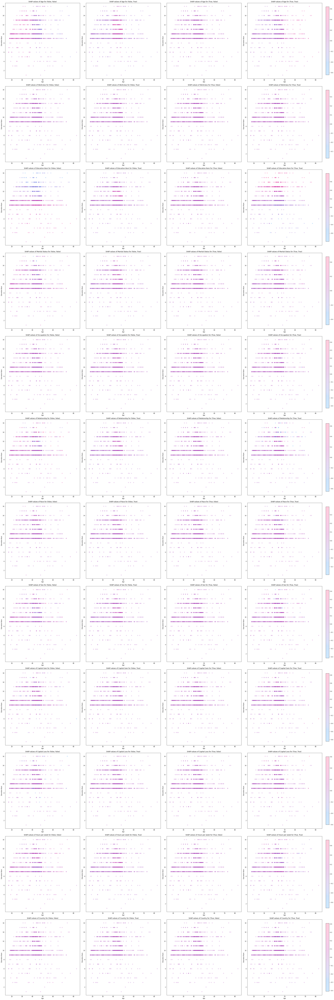

In [13]:
plot_2d(explanations.mclass_diff.labels, x='Age', y='Education-Num', alpha=0.2)

## Feature importance

### Individual explanations

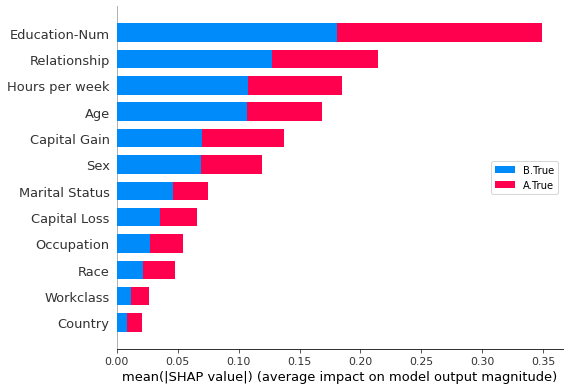

In [14]:
plot_feature_importance_bar(explanations.indiv.labels[:, :, 1].merged)

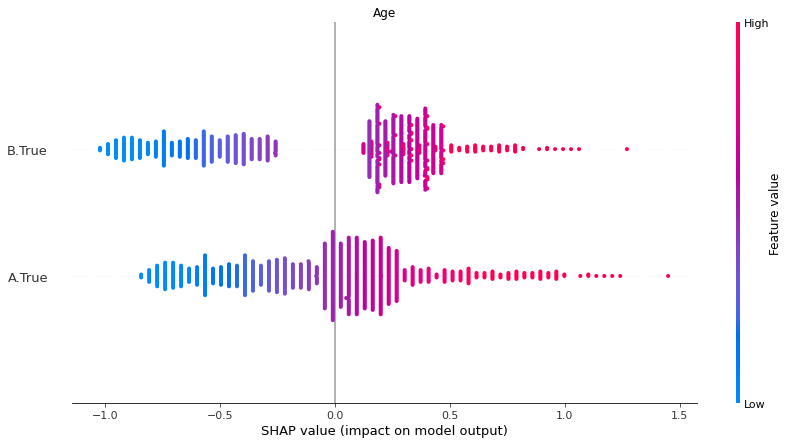

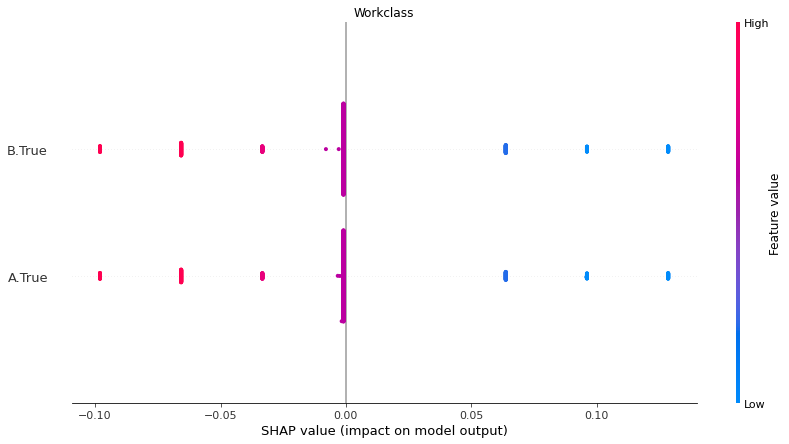

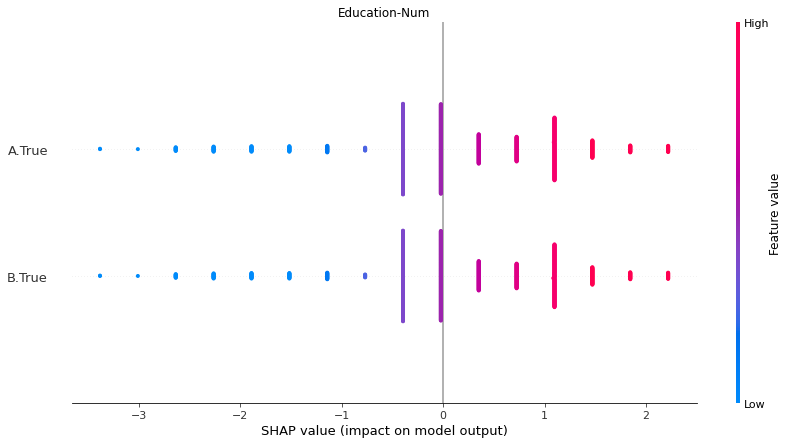

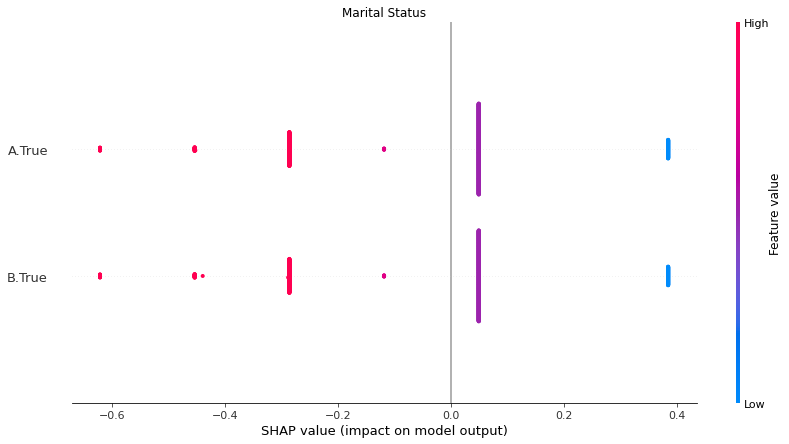

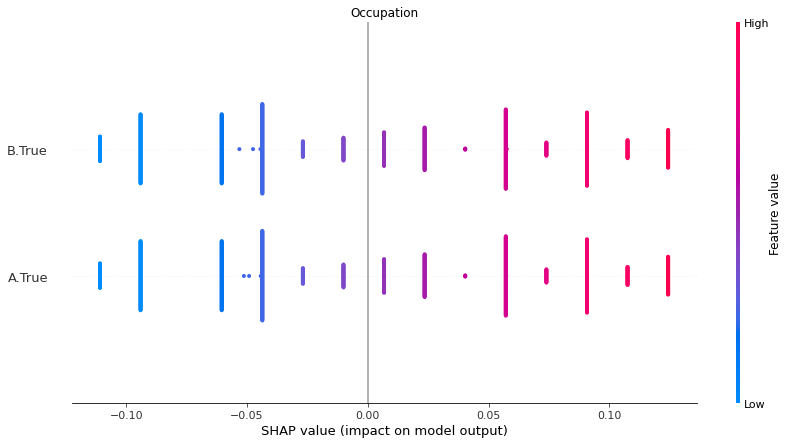

...

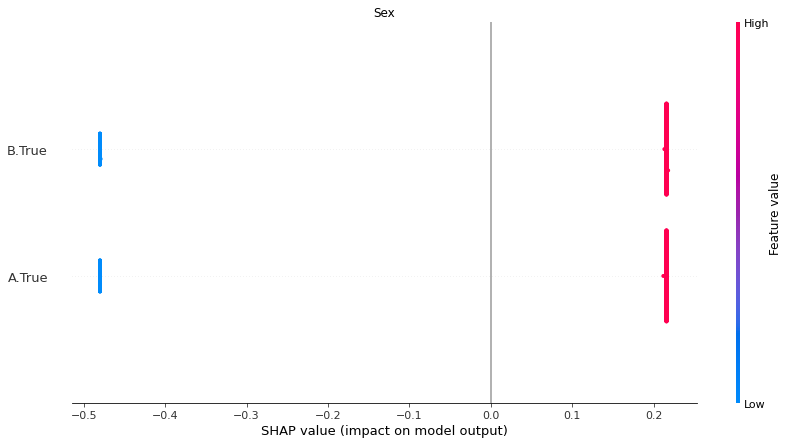

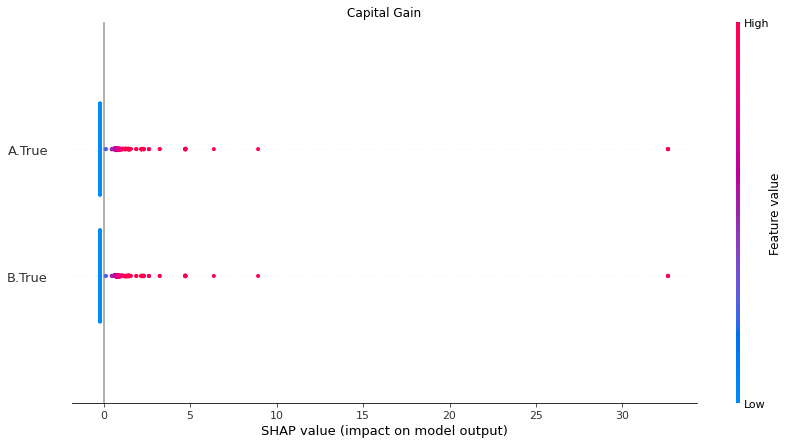

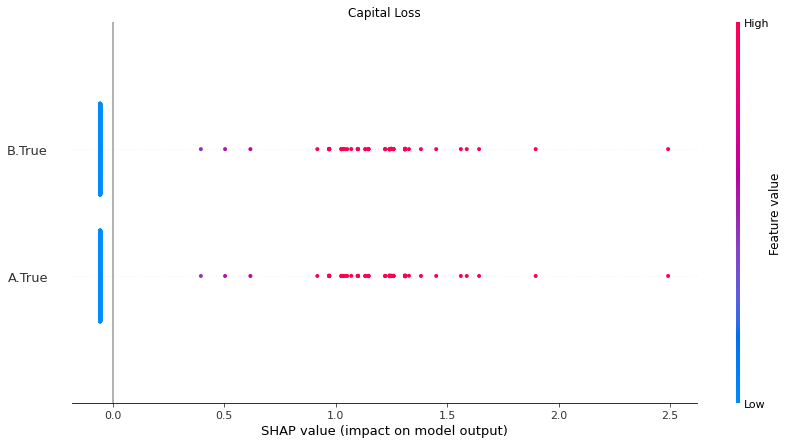

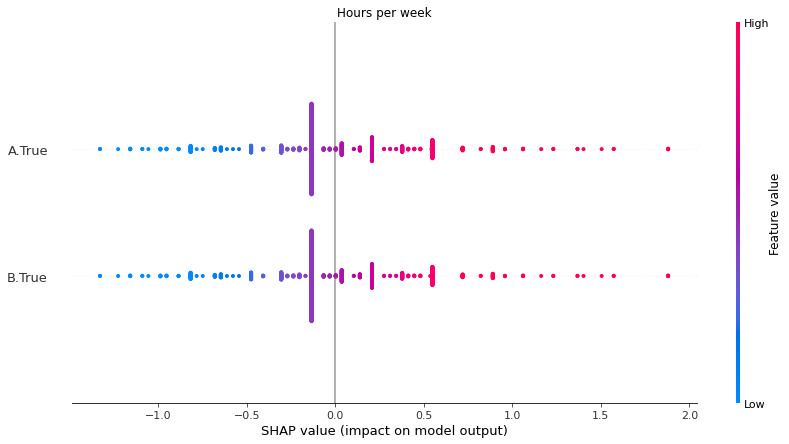

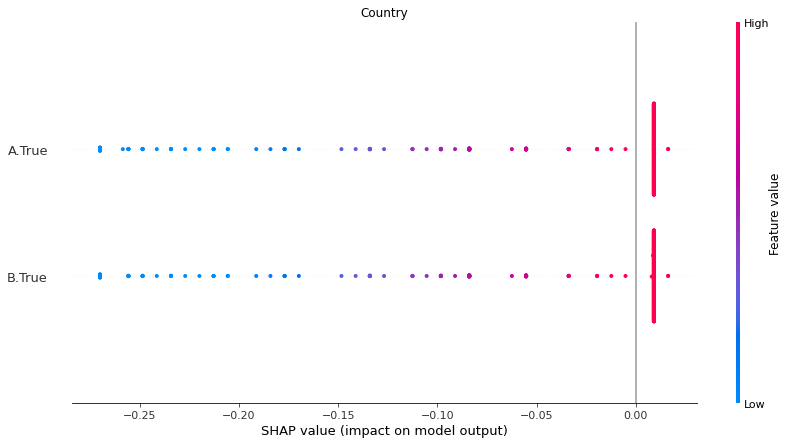

In [15]:
plot_feature_importance_scatter(explanations.indiv.log_odds[:, :, 1].merged)

### Simple subtraction explanation

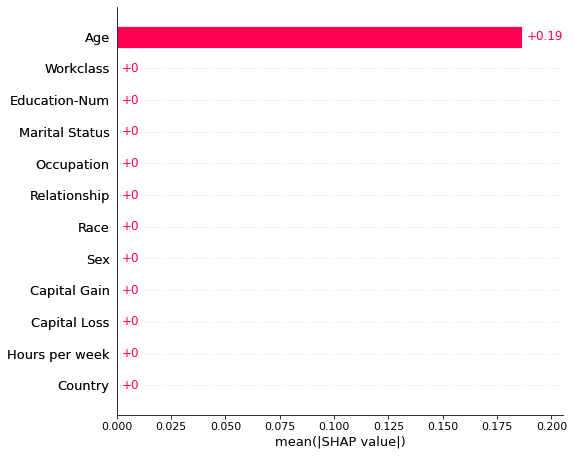

In [16]:
plot_feature_importance_bar(explanations.indiv_diff.log_odds[:, :, 1])

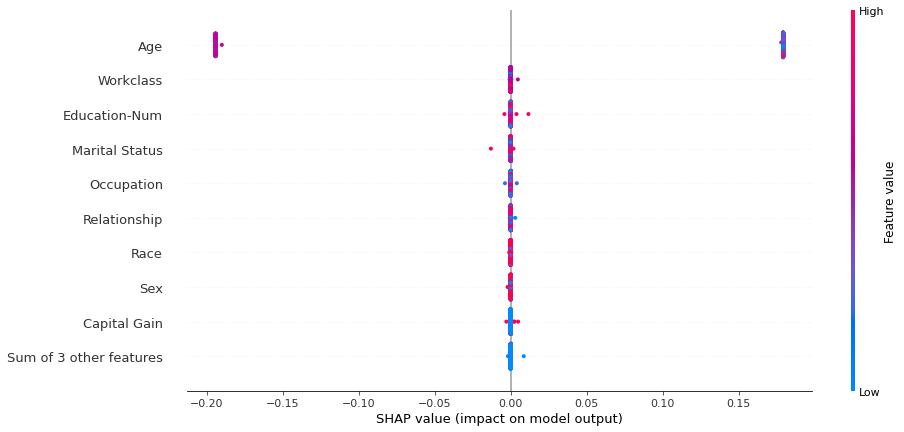

In [17]:
plot_feature_importance_scatter(explanations.indiv_diff.log_odds[:, :, 1])

### Multiclass difference classifier explanations

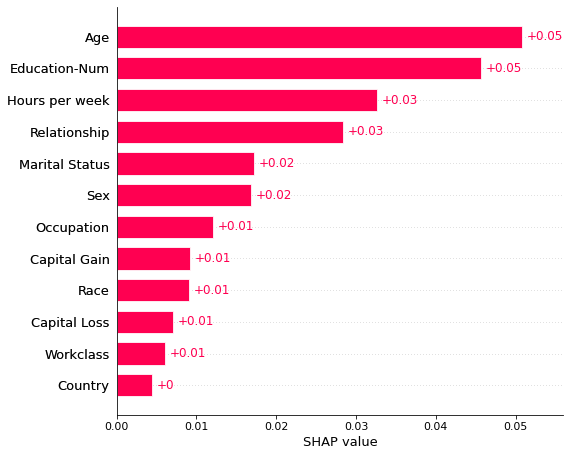

In [18]:
feature_order, feature_importance = calc_feature_order(explanations.mclass_diff.labels[:, :, comparer.difference_class_names])
plot_feature_importance_bar(feature_importance)

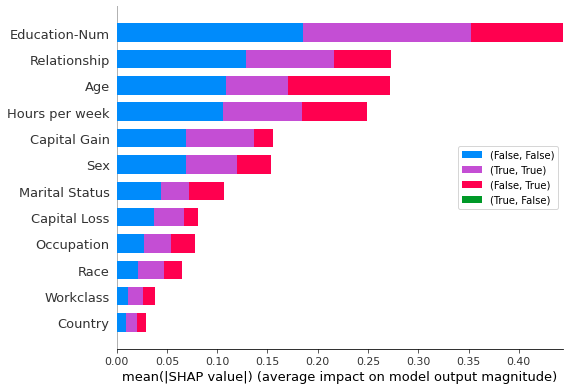

In [19]:
plot_feature_importance_bar(explanations.mclass_diff.labels)

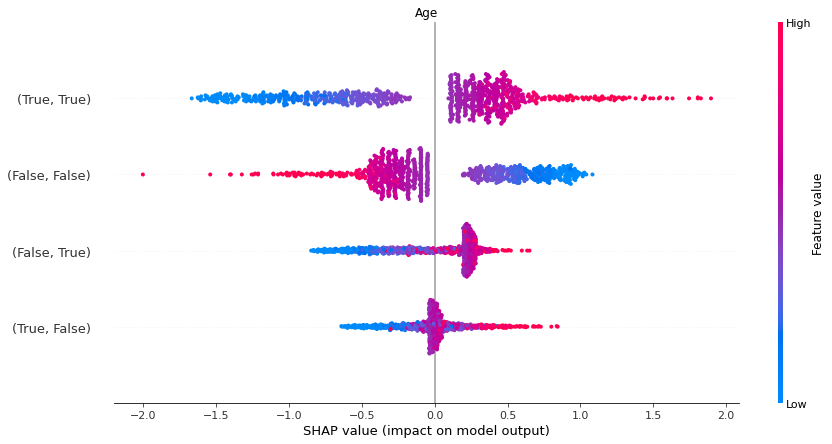

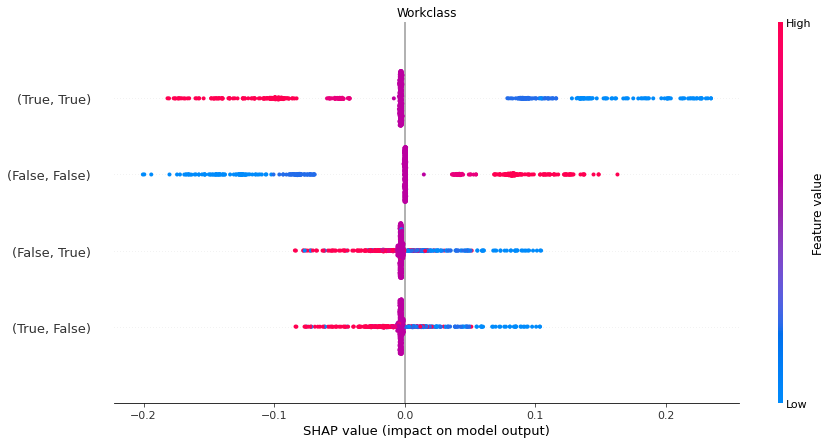

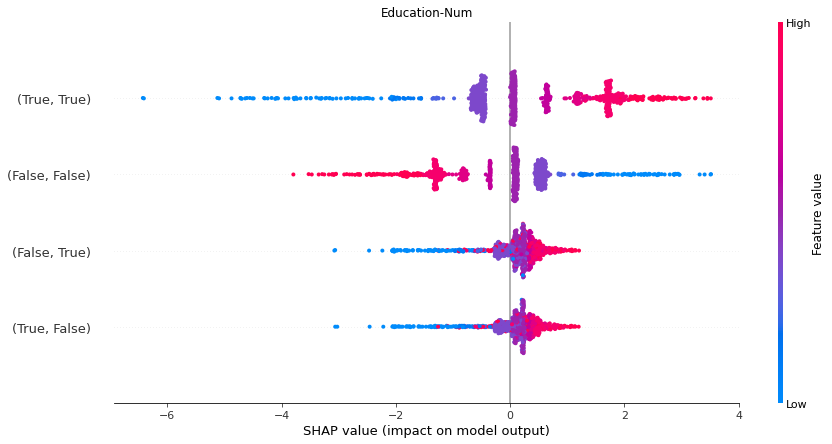

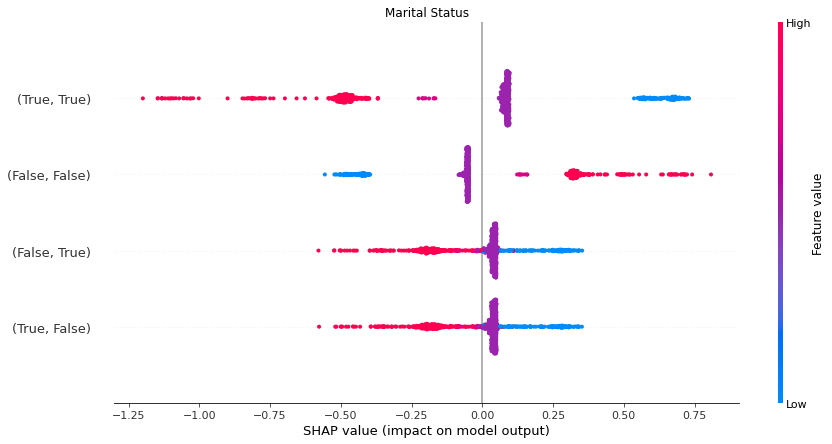

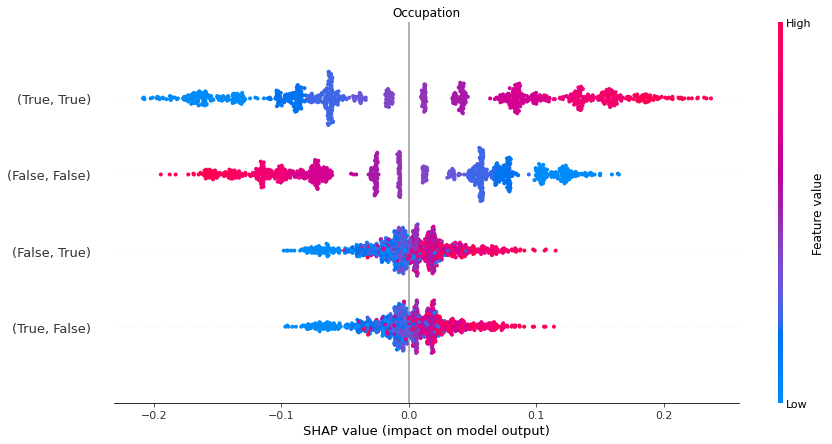

...

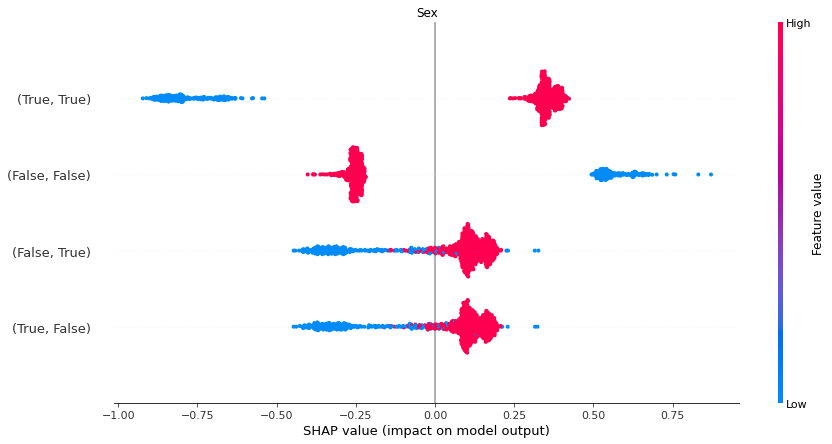

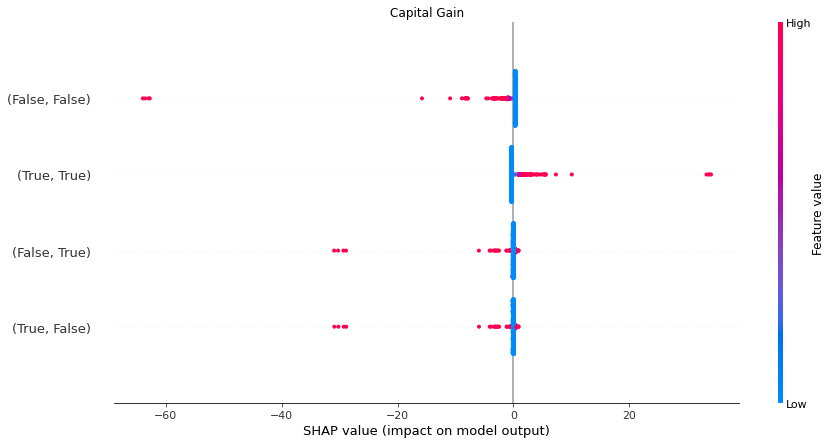

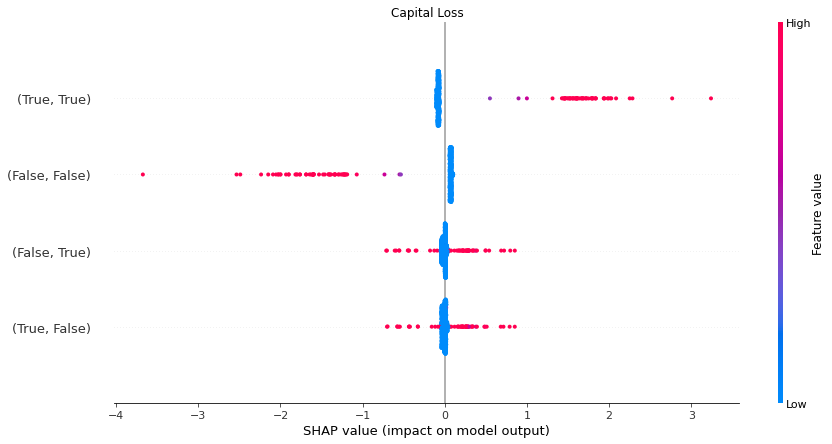

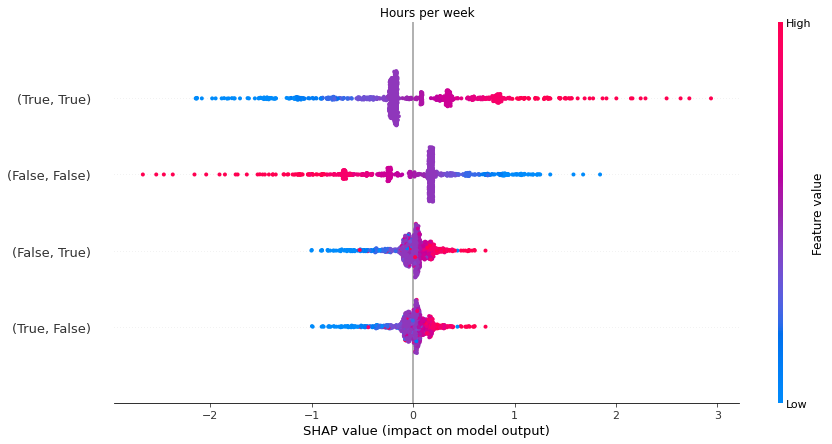

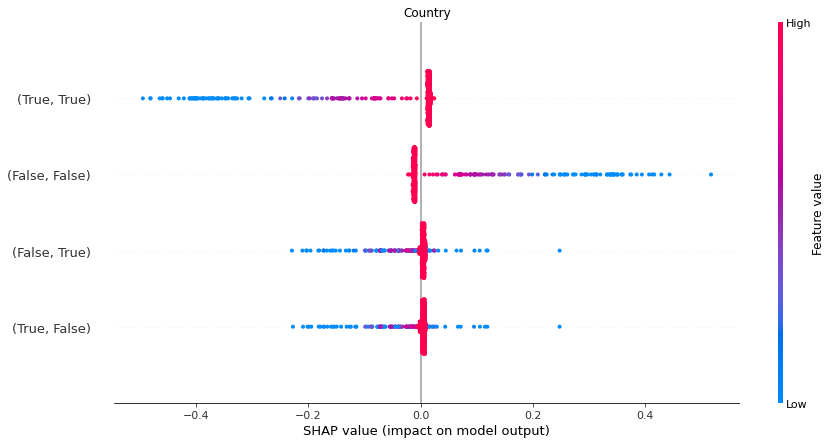

In [20]:
plot_feature_importance_scatter(explanations.mclass_diff.log_odds)

## Feature effects

### Individual explanations

Passing the fontdict parameter of _set_ticklabels() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.


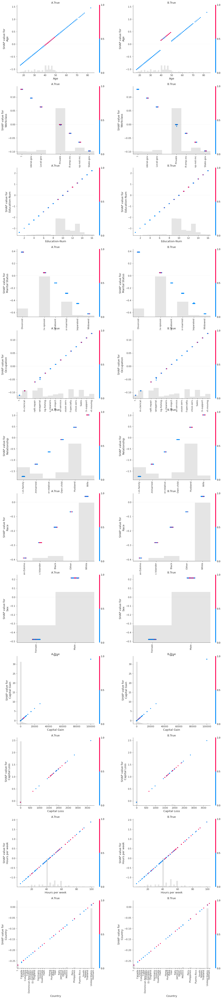

In [21]:
is_pred_diff = comparer.predict_bin_diff(explanations.data)
plot_feature_effects(explanations.indiv.log_odds[:, :, 1].merged, color=is_pred_diff)

### Simple subtraction explanation

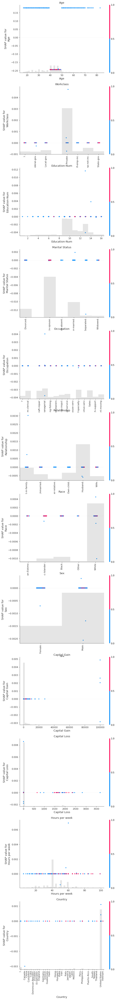

In [22]:
plot_feature_effects(explanations.indiv_diff.log_odds[:, :, 1], color=is_pred_diff)

### Multiclass difference classifier explanations

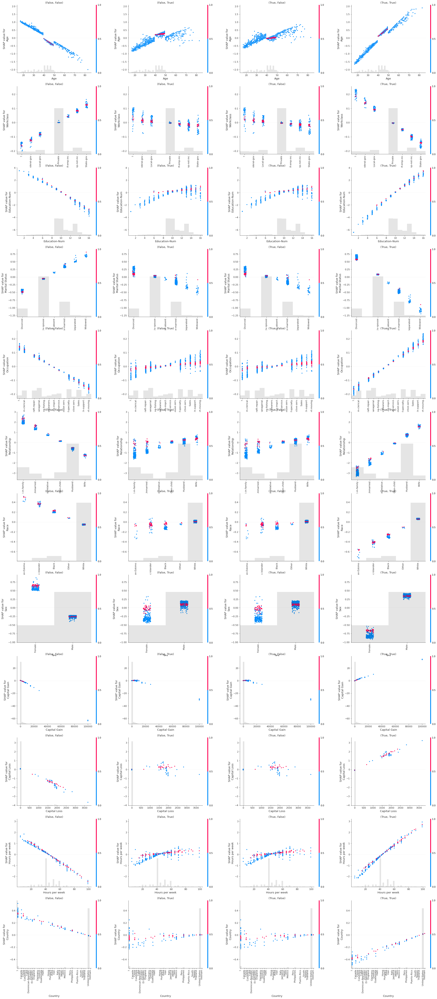

In [23]:
plot_feature_effects(explanations.mclass_diff.log_odds, color=is_pred_diff)

## Cluster instances

### Individual explanations

In [24]:
instance_order = calc_instance_order(explanations.merged)

In [25]:
plot_forces(explanations.indiv.proba[:, :, 1].merged, instance_order=instance_order)

### Simple subtraction explanation

In [26]:
plot_forces(explanations.indiv_diff.proba, instance_order=instance_order)

### Multiclass difference classifier explanations

In [28]:
plot_forces(explanations.bin_diff.labels, instance_order=instance_order)

In [27]:
plot_forces(explanations.mclass_diff.proba[:, :, comparer.difference_class_names], instance_order=instance_order)